In [1]:
# Portions of this code were writen with the assistance of AI tools (Gemini)

import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)

# HERE!!
# Run in from base conda environment for the gif creation for stateweide event

# Statewide event
- See /home/csutter/DRIVE-clean/weather_events/notebooks/statewide_event_gif.ipynb for nowcast version

In [3]:
from datetime import datetime, timedelta

def generate_timestamps():
    timestamps = []

    # 1. Jan 23 and 24: Every 4 hours
    current = datetime(2026, 1, 23, 0, 0)
    end_jan24 = datetime(2026, 1, 25, 0, 0)
    while current < end_jan24:
        timestamps.append(current)
        current += timedelta(hours=4)

    # 2. Jan 25: Every hour
    current = datetime(2026, 1, 25, 0, 0)
    end_jan25 = datetime(2026, 1, 26, 0, 0)
    while current < end_jan25:
        timestamps.append(current)
        current += timedelta(hours=1)

    # 3. Jan 26: Specific irregular hours
    jan_26_hours = [0, 1, 2, 3, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22]
    for hour in jan_26_hours:
        timestamps.append(datetime(2026, 1, 26, hour, 0))

    # 4. Jan 27 and 28: Every 4 hours
    current = datetime(2026, 1, 27, 0, 0)
    end_jan28 = datetime(2026, 1, 29, 0, 0)
    while current < end_jan28:
        timestamps.append(current)
        current += timedelta(hours=4)

    # 5. Print with index and requested string format
    for index, dt in enumerate(timestamps):
        formatted_time = dt.strftime('%Y%m%d_%H%M')
        print(f"{index}, {formatted_time}")

if __name__ == "__main__":
    generate_timestamps()

0, 20260123_0000
1, 20260123_0400
2, 20260123_0800
3, 20260123_1200
4, 20260123_1600
5, 20260123_2000
6, 20260124_0000
7, 20260124_0400
8, 20260124_0800
9, 20260124_1200
10, 20260124_1600
11, 20260124_2000
12, 20260125_0000
13, 20260125_0100
14, 20260125_0200
15, 20260125_0300
16, 20260125_0400
17, 20260125_0500
18, 20260125_0600
19, 20260125_0700
20, 20260125_0800
21, 20260125_0900
22, 20260125_1000
23, 20260125_1100
24, 20260125_1200
25, 20260125_1300
26, 20260125_1400
27, 20260125_1500
28, 20260125_1600
29, 20260125_1700
30, 20260125_1800
31, 20260125_1900
32, 20260125_2000
33, 20260125_2100
34, 20260125_2200
35, 20260125_2300
36, 20260126_0000
37, 20260126_0100
38, 20260126_0200
39, 20260126_0300
40, 20260126_0400
41, 20260126_0600
42, 20260126_0800
43, 20260126_1000
44, 20260126_1200
45, 20260126_1400
46, 20260126_1600
47, 20260126_1800
48, 20260126_2000
49, 20260126_2200
50, 20260127_0000
51, 20260127_0400
52, 20260127_0800
53, 20260127_1200
54, 20260127_1600
55, 20260127_2000
56

In [ ]:
# cols of operational outputs: 
location_id,latitude,longitude,hrrr_file_path,m0_pred,m0_prob_dry,m0_prob_poor_viz,m0_prob_snow,m0_prob_snow_severe,m0_prob_wet,m1_pred,m1_prob_dry,m1_prob_poor_viz,m1_prob_snow,m1_prob_snow_severe,m1_prob_wet,m2_pred,m2_prob_dry,m2_prob_poor_viz,m2_prob_snow,m2_prob_snow_severe,m2_prob_wet,m3_pred,m3_prob_dry,m3_prob_poor_viz,m3_prob_snow,m3_prob_snow_severe,m3_prob_wet,m4_pred,m4_prob_dry,m4_prob_poor_viz,m4_prob_snow,m4_prob_snow_severe,m4_prob_wet,ensembleAvg_prob_snow_severe,ensembleAvg_prob_snow,ensembleAvg_prob_wet,ensembleAvg_prob_dry,ensembleAvg_prob_poor_viz,ensembleAvg_pred,ensembleMaxConf_pred,ensembleMode_pred,select,decision_logic,select_prob,num_models_pred_cat,conf_consist,conf_probability,conf_overall,confidence



In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import imageio.v2 as imageio 
import os
from glob import glob
import numpy as np
import matplotlib.path as mpath

# --- DIRECTORIES ---
base_forecast_dir = "/home/csutter/DRIVE-clean/forecast_operational_runs/set6_statewide_event_jan2026_sample/data3_ensembling"
gif_output_dir = "/home/csutter/DRIVE-clean/forecast_weather_events/data/statewide_gifs"

# Ensure output directory exists
os.makedirs(gif_output_dir, exist_ok=True)

# --- TARGET DATES ---
raw_dates = [
    "0,20260123_0000", "6,20260124_0000", "12,20260125_0000",
    "23,20260125_1100", "24,20260125_1200", "25,20260125_1300",
    "26,20260125_1400", "28,20260125_1600", "28,20260125_2000",
    "44,20260126_1200", "50,20260127_0000", "56,20260128_0000"
]
target_timestamps = [d.split(',')[1] for d in raw_dates]

# --- APPLY FONT STYLING ---
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['STIXGeneral', 'Times New Roman', 'DejaVu Serif']

custom_colors = {
    'dry': '#71c249',           
    'wet': '#70a8db',           
    'snow': 'pink',          
    'snow_severe': '#eb3324',   
    'poor_viz': '#4a148c'       
}

# --- LOAD BORDERS ---
ny_border = pd.read_csv("/home/csutter/DRIVE-clean/data_misc/NY_border_coords.csv")
ny_roads = pd.read_csv("/home/csutter/DRIVE-clean/data_misc/NY_roads_coords.csv")

print("Building NY boundary polygons to filter out out-of-state cameras...")
ny_paths = []
current_poly = []
for lon, lat in zip(ny_border['Longitude'], ny_border['Latitude']):
    if pd.isna(lon):
        if len(current_poly) > 2:
            ny_paths.append(mpath.Path(current_poly))
        current_poly = []
    else:
        current_poly.append((lon, lat))

# --- DYNAMICALLY FIND ALL AVAILABLE LEAD TIMES (FH) ---
first_ts = target_timestamps[0]
yyyy, mm, dd = first_ts[:4], first_ts[4:6], first_ts[6:8]
sample_dir = os.path.join(base_forecast_dir, yyyy, mm, dd, first_ts)

fh_files = glob(os.path.join(sample_dir, "finalpreds_FH*.csv"))
fh_list = sorted([os.path.basename(f).replace('finalpreds_', '').replace('.csv', '') for f in fh_files])

print(f"Found {len(fh_list)} lead times: {fh_list}")

frames_by_fh = {fh: [] for fh in fh_list}

# --- MASTER LOOP ---
for index, timestamp in enumerate(target_timestamps):
    print(f"\nProcessing Valid Time: {timestamp}")
    
    yyyy = timestamp[:4]
    mm = timestamp[4:6]
    dd = timestamp[6:8]
    ts_dir = os.path.join(base_forecast_dir, yyyy, mm, dd, timestamp)
    
    # Loop through every Forecast Lead Time (FH) for this timestamp
    for fh in fh_list:
        filepath = os.path.join(ts_dir, f"finalpreds_{fh}.csv")
        
        if not os.path.exists(filepath):
            print(f"  Warning: Missing file {filepath}. Skipping this frame for {fh}.")
            continue
            
        step_df = pd.read_csv(filepath)

        # Exact State Boundary Crop (using lowercase longitude/latitude)
        points = step_df[['longitude', 'latitude']].values
        in_ny_mask = np.zeros(len(points), dtype=bool)
        for poly_path in ny_paths:
            in_ny_mask |= poly_path.contains_points(points)
        step_df = step_df[in_ny_mask]
        
        # Setup Figure
        fig, ax = plt.subplots(figsize=(15, 12))
        fig.patch.set_facecolor('white') 
        
        # Layer 1: State Border
        ax.plot(ny_border['Longitude'], ny_border['Latitude'], color='#aaaaaa', linewidth=1.5, zorder=1)
            
        # Layer 2: Roads
        ax.plot(ny_roads['Longitude'], ny_roads['Latitude'], color='black', linewidth=0.3, alpha=0.5, zorder=2)

        # Layer 3: Cameras (using lowercase longitude/latitude)
        for condition, color_hex in custom_colors.items():
            subset = step_df[step_df['select'] == condition]
            if not subset.empty:
                ax.scatter(
                    subset['longitude'], subset['latitude'], 
                    c=color_hex, s=60, label=condition, 
                    edgecolors='black', linewidths=0.5, zorder=3
                )
        
        # Formatting and Cropping
        ax.set_axis_off()
        ax.set_aspect(1.0 / np.cos(np.radians(43.0)))
        ax.set_xlim(-80.0, -71.5)
        ax.set_ylim(40.4, 45.1)
        
        plt.title(f"Statewide Forecast Predictions ({fh})\nValid Time: {timestamp}", 
                  fontsize=24, fontstyle='normal', pad=5, y=1.0)
        plt.legend(loc='upper left', title="Predicted Condition", fontsize=12, title_fontsize=14)
        
        frame_name = f"temp_frame_{timestamp}_{fh}.png"
        plt.savefig(frame_name, dpi=150, facecolor='white', bbox_inches='tight')
        plt.close(fig) 
        
        frames_by_fh[fh].append(frame_name)
    
    print(f"  Finished map frames for {timestamp}.")

# --- STITCH THE FRAMES INTO GIFS ---
print("\nStitching frames into GIFs...")

for fh, filenames in frames_by_fh.items():
    if not filenames:
        continue
        
    gif_path = os.path.join(gif_output_dir, f"jan2026_forecast_{fh}.gif")
    
    with imageio.get_writer(gif_path, mode='I', duration=500, loop=0) as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)

    # Clean up the temp frames for this FH
    for filename in filenames:
        os.remove(filename)

    print(f"Success! Movie saved as: {gif_path}")

print("\nAll GIFs have been generated!")

Building NY boundary polygons to filter out out-of-state cameras...
Found 14 lead times: ['FH02', 'FH03', 'FH04', 'FH05', 'FH06', 'FH09', 'FH12', 'FH15', 'FH18', 'FH24', 'FH30', 'FH36', 'FH42', 'FH48']

Processing Valid Time: 20260123_0000
  Finished map frames for 20260123_0000.

Processing Valid Time: 20260124_0000
  Finished map frames for 20260124_0000.

Processing Valid Time: 20260125_0000
  Finished map frames for 20260125_0000.

Processing Valid Time: 20260125_1100
  Finished map frames for 20260125_1100.

Processing Valid Time: 20260125_1200
  Finished map frames for 20260125_1200.

Processing Valid Time: 20260125_1300
  Finished map frames for 20260125_1300.

Processing Valid Time: 20260125_1400
  Finished map frames for 20260125_1400.

Processing Valid Time: 20260125_1600
  Finished map frames for 20260125_1600.

Processing Valid Time: 20260125_2000
  Finished map frames for 20260125_2000.

Processing Valid Time: 20260126_1200
  Finished map frames for 20260126_1200.

Process

# Onset w/ LE or some event

In [ ]:
# Identified from the "better" LE event from:
# notebook:/home/csutter/DRIVE-clean/weather_events/notebooks/visualize_stats_events_modelpred.ipynb 
# eventid : 1233926

In [6]:
files_tolookat = ['/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2200/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2200/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2230/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2230/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2330/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/19/20250119_2330/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0000/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0030/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0100/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0130/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0200/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0230/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0230/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_0300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1100/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1100/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1100/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1200/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1200/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1200/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1300/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1600/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1600/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1600/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1700/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1700/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1700/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1700/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1800/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1830/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1900/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1900/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1930/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_1930/finalpreds.csv', '/home/csutter/DRIVE-clean/operational_runs_wMRMS/data_6_ensembling/2025/01/20/20250120_2000/finalpreds.csv']


sites_tolookat = ['Skyline_8279', 'Skyline_8279', 'Skyline_8281', 'Skyline_8281', 'Skyline_8297', 'Skyline_8297', 'Skyline_6117', 'Skyline_6117', 'Skyline_1804', 'Skyline_1804', 'Skyline_8236', 'Skyline_8236', 'Skyline_8295', 'Skyline_8295', 'Skyline_8283', 'Skyline_8283', 'Skyline_5026', 'Skyline_5026', 'Skyline_8306', 'Skyline_8306', 'Skyline_5860', 'Skyline_5860', 'Skyline_5053', 'Skyline_5053', 'Skyline_5000', 'Skyline_5000', 'Skyline_5004', 'Skyline_5004', 'Skyline_5898', 'Skyline_5898', 'Skyline_5013', 'Skyline_5013', 'Skyline_5885', 'Skyline_5885', 'Skyline_5887', 'Skyline_5887', 'Skyline_5020', 'Skyline_5020', 'Skyline_5012', 'Skyline_5012', 'Skyline_5032', 'Skyline_5032', 'Skyline_5023', 'Skyline_5023', 'Skyline_5005', 'Skyline_5005', 'Skyline_5035', 'Skyline_5035', 'Skyline_8277', 'Skyline_8277', 'Skyline_5031', 'Skyline_5031', 'Skyline_5009', 'Skyline_5009', 'Skyline_8310', 'Skyline_8310', 'Skyline_8307', 'Skyline_8307', 'Skyline_5021', 'Skyline_5021', 'Skyline_5060', 'Skyline_5060', 'Skyline_5025', 'Skyline_5025', 'Skyline_5055', 'Skyline_5055', 'Skyline_5880', 'Skyline_5880', 'Skyline_5881', 'Skyline_5881', 'Skyline_5879', 'Skyline_5879', 'Skyline_5016', 'Skyline_5016', 'Skyline_5010', 'Skyline_5010', 'Skyline_8308', 'Skyline_8308', 'Skyline_5056', 'Skyline_5056', 'Skyline_5875', 'Skyline_5875', 'Skyline_5046', 'Skyline_5046', 'Skyline_5047', 'Skyline_5047', 'Skyline_5876', 'Skyline_5876', 'Skyline_5870', 'Skyline_5870', 'Skyline_5011', 'Skyline_5011', 'Skyline_5871', 'Skyline_5871', 'Skyline_5054', 'Skyline_5054', 'Skyline_5007', 'Skyline_5007', 'Skyline_5872', 'Skyline_5872', 'Skyline_4998', 'Skyline_4998', 'Skyline_5044', 'Skyline_5044', 'Skyline_5014', 'Skyline_5014', 'Skyline_5561', 'Skyline_5561', 'Skyline_1801', 'Skyline_1801', 'Skyline_5562', 'Skyline_5562', 'Skyline_2135', 'Skyline_2135', 'Skyline_2137', 'Skyline_2137', 'Skyline_2136', 'Skyline_2136', 'Skyline_1803', 'Skyline_1803', 'Skyline_1800', 'Skyline_1800', 'Skyline_1799', 'Skyline_1799', 'Skyline_2134', 'Skyline_2134', 'Skyline_1806', 'Skyline_1806', 'Skyline_6724', 'Skyline_6724', 'Skyline_2119', 'Skyline_2119', 'Skyline_2131', 'Skyline_2131', 'Skyline_1811', 'Skyline_1811', 'Skyline_1809', 'Skyline_1809', 'Skyline_1807', 'Skyline_1807', 'Skyline_5560', 'Skyline_5560', 'Skyline_1808', 'Skyline_1808', 'Skyline_1813', 'Skyline_1813', 'Skyline_1815', 'Skyline_1815', 'Skyline_1810', 'Skyline_1810', 'Skyline_2129', 'Skyline_2129', 'Skyline_1814', 'Skyline_1814', 'Skyline_1812', 'Skyline_1812', 'Skyline_2118', 'Skyline_2118', 'Skyline_1816', 'Skyline_1816', 'Skyline_5559', 'Skyline_5559', 'Skyline_2121', 'Skyline_2121', 'Skyline_2122', 'Skyline_2122', 'Skyline_2123', 'Skyline_2123', 'Skyline_2124', 'Skyline_2124', 'Skyline_6491', 'Skyline_6491', 'Skyline_8235', 'Skyline_8235', 'Skyline_8300', 'Skyline_8300', 'Skyline_8299', 'Skyline_8299', 'Skyline_5884', 'Skyline_5884', 'Skyline_2127', 'Skyline_2127', 'Skyline_5059', 'Skyline_5059', 'Skyline_5551', 'Skyline_5551', 'Skyline_5552', 'Skyline_5552', 'Skyline_5883', 'Skyline_5883', 'Skyline_5995', 'Skyline_5995', 'Skyline_5882', 'Skyline_5882', 'Skyline_5553', 'Skyline_5553', 'Skyline_5027', 'Skyline_5027', 'Skyline_5554', 'Skyline_5554', 'Skyline_5008', 'Skyline_5008', 'Skyline_5002', 'Skyline_5002', 'Skyline_5997', 'Skyline_5997', 'Skyline_8291', 'Skyline_8291', 'Skyline_5049', 'Skyline_5049', 'Skyline_5052', 'Skyline_5052', 'Skyline_5889', 'Skyline_5889', 'Skyline_5018', 'Skyline_5018', 'Skyline_5050', 'Skyline_5050', 'Skyline_5022', 'Skyline_5022', 'Skyline_5873', 'Skyline_5873', 'Skyline_5038', 'Skyline_5038', 'Skyline_5061', 'Skyline_5061', 'Skyline_5874', 'Skyline_5874', 'Skyline_5866', 'Skyline_5866', 'Skyline_8287', 'Skyline_8287', 'Skyline_5557', 'Skyline_5557', 'Skyline_8289', 'Skyline_8289', 'Skyline_5888', 'Skyline_5888', 'Skyline_8288', 'Skyline_8288', 'Skyline_5033', 'Skyline_5033', 'Skyline_5019', 'Skyline_5019', 'Skyline_2128', 'Skyline_2128', 'Skyline_5892', 'Skyline_5892', 'Skyline_5541', 'Skyline_5541', 'Skyline_5542', 'Skyline_5542', 'Skyline_5566', 'Skyline_5566', 'Skyline_5543', 'Skyline_5543', 'Skyline_5547', 'Skyline_5547', 'Skyline_5548', 'Skyline_5548', 'Skyline_5550', 'Skyline_5550', 'Skyline_2132', 'Skyline_2132', 'Skyline_5565', 'Skyline_5565', 'Skyline_1805', 'Skyline_1805', 'Skyline_5563', 'Skyline_5563', 'Skyline_5564', 'Skyline_5564', 'Skyline_1818', 'Skyline_1818', 'Skyline_1817', 'Skyline_1817', 'Skyline_2120', 'Skyline_2120', 'Skyline_2125', 'Skyline_2125', 'Skyline_5041', 'Skyline_5041', 'Skyline_5039', 'Skyline_5039', 'Skyline_5063', 'Skyline_5063', 'Skyline_5064', 'Skyline_5064', 'Skyline_5893', 'Skyline_5893', 'Skyline_5017', 'Skyline_5017', 'Skyline_5996', 'Skyline_5996', 'Skyline_5558', 'Skyline_5558', 'Skyline_5024', 'Skyline_5024', 'Skyline_8309', 'Skyline_8309', 'Skyline_5051', 'Skyline_5051', 'Skyline_8311', 'Skyline_8311', 'Skyline_5057', 'Skyline_5057', 'Skyline_5065', 'Skyline_5065', 'Skyline_5029', 'Skyline_5029', 'Skyline_5863', 'Skyline_5863', 'Skyline_5868', 'Skyline_5868', 'Skyline_8285', 'Skyline_8285', 'Skyline_8286', 'Skyline_8286', 'Skyline_8278', 'Skyline_8278', 'Skyline_5890', 'Skyline_5890', 'Skyline_5042', 'Skyline_5042', 'Skyline_5045', 'Skyline_5045', 'Skyline_5040', 'Skyline_5040', 'Skyline_5895', 'Skyline_5895', 'Skyline_5894', 'Skyline_5894', 'Skyline_5015', 'Skyline_5015', 'Skyline_5058', 'Skyline_5058', 'Skyline_5048', 'Skyline_5048', 'Skyline_5877', 'Skyline_5877', 'Skyline_5897', 'Skyline_5897', 'Skyline_5886', 'Skyline_5886', 'Skyline_5043', 'Skyline_5043']

# Convert to set for faster lookups
unique_sites = set(sites_tolookat)
print(len(unique_sites))

unique_files = list(set(files_tolookat))

173


Add in fcst data too

In [7]:
import pandas as pd
import os

# --- PREVIOUS SETUP ASSUMED ---
# unique_sites = set(sites_tolookat)
# unique_files = list(set(files_tolookat))

fcst_base_dir = "/home/csutter/DRIVE-clean/forecast_operational_runs/set3_lakeeffect/data3_ensembling"

master_df_list = []

# --- TASK 1: Read, filter, merge, and compile into master DF ---
for file in unique_files:
    try:
        # 1. Read NOWCAST data and filter by site
        nowcast_df = pd.read_csv(file)
        subset_nowcast = nowcast_df[nowcast_df['site'].isin(unique_sites)].copy()
        
        # Extract datetime
        datetime_val = file.split('/')[-2]
        subset_nowcast['datetime'] = datetime_val
        
        # 2. Construct FORECAST file path dynamically
        # Extract YYYY, MM, DD from 'YYYYMMDD_HHMM'
        yyyy = datetime_val[:4]
        mm = datetime_val[4:6]
        dd = datetime_val[6:8]
        fcst_file = os.path.join(fcst_base_dir, yyyy, mm, dd, datetime_val, "finalpreds_FH02.csv")
        
        # 3. Read and Merge FORECAST data
        if os.path.exists(fcst_file):
            fcst_df = pd.read_csv(fcst_file)
            
            # Isolate only the columns we need to merge, to avoid duplicate/overlapping columns
            fcst_subset = fcst_df[['latitude', 'longitude', 'select', 'select_prob']].copy()
            
            # Rename the target forecast columns
            fcst_subset.rename(columns={
                'select': 'select_fcst', 
                'select_prob': 'select_prob_fcst'
            }, inplace=True)
            
            # Execute INNER MERGE on latitude and longitude
            merged_df = pd.merge(subset_nowcast, fcst_subset, on=['latitude', 'longitude'], how='inner')
            
            master_df_list.append(merged_df)
            print(f"Successfully processed and merged {datetime_val}")
        else:
            print(f"Warning: Forecast file missing for {datetime_val}. Appending nowcast only.")
            # To prevent the pivot from breaking if a forecast file is missing, fill with placeholders
            subset_nowcast['select_fcst'] = 'No Data'
            subset_nowcast['select_prob_fcst'] = 'No Data'
            master_df_list.append(subset_nowcast)
            
    except Exception as e:
        print(f"Error processing {file}: {e}")

# Combine into one massive dataframe
master_df = pd.concat(master_df_list, ignore_index=True)

# --- TASK 2: Pivot the DataFrame for ALL FOUR columns ---
# We add the two new forecast columns to the 'values' list
pivot_df = master_df.pivot_table(
    index='site', 
    columns='datetime', 
    values=['select', 'img_orig', 'select_fcst'], 
    aggfunc='first'
)

# Group the datetimes together chronologically 
pivot_df = pivot_df.swaplevel(0, 1, axis=1).sort_index(axis=1)

# Flatten the MultiIndex into clean string column names 
# (e.g., "20250119_2200_select_fcst")
pivot_df.columns = [f"{col[0]}_{col[1]}" for col in pivot_df.columns]

# Pull 'site' out of the index and back into a normal column
pivot_df = pivot_df.reset_index()

# Fill missing times/data with 'No Data' 
pivot_df = pivot_df.fillna('No Data')

# Check the results
print("\n--- Final Pivoted DataFrame Head ---")
display(pivot_df[40:60])

# Save to CSV
# pivot_df.to_csv("storm_onset_comparisons.csv", index=False)

Successfully processed and merged 20250120_1100
Successfully processed and merged 20250120_1300
Successfully processed and merged 20250119_2330
Successfully processed and merged 20250119_2300
Successfully processed and merged 20250120_0100
Successfully processed and merged 20250120_1700
Successfully processed and merged 20250120_0130
Successfully processed and merged 20250120_1800
Successfully processed and merged 20250120_1900
Successfully processed and merged 20250120_1600
Successfully processed and merged 20250120_1830
Successfully processed and merged 20250120_0000
Successfully processed and merged 20250120_0200
Successfully processed and merged 20250120_2000
Successfully processed and merged 20250120_1930
Successfully processed and merged 20250120_0230
Successfully processed and merged 20250119_2230
Successfully processed and merged 20250119_2200
Successfully processed and merged 20250120_0300
Successfully processed and merged 20250120_0030
Successfully processed and merged 202501

,site,20250119_2200_img_orig,20250119_2200_select,20250119_2200_select_fcst,20250119_2230_img_orig,20250119_2230_select,20250119_2230_select_fcst,20250119_2300_img_orig,20250119_2300_select,20250119_2300_select_fcst,20250119_2330_img_orig,20250119_2330_select,20250119_2330_select_fcst,20250120_0000_img_orig,20250120_0000_select,20250120_0000_select_fcst,20250120_0030_img_orig,20250120_0030_select,20250120_0030_select_fcst,20250120_0100_img_orig,20250120_0100_select,20250120_0100_select_fcst,20250120_0130_img_orig,20250120_0130_select,20250120_0130_select_fcst,20250120_0200_img_orig,20250120_0200_select,20250120_0200_select_fcst,20250120_0230_img_orig,20250120_0230_select,20250120_0230_select_fcst,20250120_0300_img_orig,20250120_0300_select,20250120_0300_select_fcst,20250120_1100_img_orig,20250120_1100_select,20250120_1100_select_fcst,20250120_1200_img_orig,20250120_1200_select,20250120_1200_select_fcst,20250120_1300_img_orig,20250120_1300_select,20250120_1300_select_fcst,20250120_1600_img_orig,20250120_1600_select,20250120_1600_select_fcst,20250120_1700_img_orig,20250120_1700_select,20250120_1700_select_fcst,20250120_1800_img_orig,20250120_1800_select,20250120_1800_select_fcst,20250120_1830_img_orig,20250120_1830_select,20250120_1830_select_fcst,20250120_1900_img_orig,20250120_1900_select,20250120_1900_select_fcst,20250120_1930_img_orig,20250120_1930_select,20250120_1930_select_fcst,20250120_2000_img_orig,20250120_2000_select,20250120_2000_select_fcst
40,Skyline_5005,/home/csutter/cron/data/Skyline_5005/20250119/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250119/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250119/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250119/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow_severe,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow_severe,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5005/20250120/...,wet,snow
41,Skyline_5007,/home/csutter/cron/data/Skyline_5007/20250119/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250119/...,dry,snow,/home/csutter/cron/data/Skyline_5007/20250119/...,dry,snow,/home/csutter/cron/data/Skyline_5007/20250119/...,dry,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,dry,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,wet,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,wet,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,wet,/home/csutter/cron/data/Skyline_5007/20250120/...,snow_severe,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow_severe,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5007/20250120/...,wet,snow,/home/csutter/cron/data/S

In [14]:
pivot_df[pivot_df["20250120_1100_select_fcst"]=="snow_severe"]

,site,20250119_2200_img_orig,20250119_2200_select,20250119_2200_select_fcst,20250119_2230_img_orig,20250119_2230_select,20250119_2230_select_fcst,20250119_2300_img_orig,20250119_2300_select,20250119_2300_select_fcst,20250119_2330_img_orig,20250119_2330_select,20250119_2330_select_fcst,20250120_0000_img_orig,20250120_0000_select,20250120_0000_select_fcst,20250120_0030_img_orig,20250120_0030_select,20250120_0030_select_fcst,20250120_0100_img_orig,20250120_0100_select,20250120_0100_select_fcst,20250120_0130_img_orig,20250120_0130_select,20250120_0130_select_fcst,20250120_0200_img_orig,20250120_0200_select,20250120_0200_select_fcst,20250120_0230_img_orig,20250120_0230_select,20250120_0230_select_fcst,20250120_0300_img_orig,20250120_0300_select,20250120_0300_select_fcst,20250120_1100_img_orig,20250120_1100_select,20250120_1100_select_fcst,20250120_1200_img_orig,20250120_1200_select,20250120_1200_select_fcst,20250120_1300_img_orig,20250120_1300_select,20250120_1300_select_fcst,20250120_1600_img_orig,20250120_1600_select,20250120_1600_select_fcst,20250120_1700_img_orig,20250120_1700_select,20250120_1700_select_fcst,20250120_1800_img_orig,20250120_1800_select,20250120_1800_select_fcst,20250120_1830_img_orig,20250120_1830_select,20250120_1830_select_fcst,20250120_1900_img_orig,20250120_1900_select,20250120_1900_select_fcst,20250120_1930_img_orig,20250120_1930_select,20250120_1930_select_fcst,20250120_2000_img_orig,20250120_2000_select,20250120_2000_select_fcst
4,Skyline_1804,/home/csutter/cron/data/Skyline_1804/20250119/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250119/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250119/...,dry,snow,/home/csutter/cron/data/Skyline_1804/20250119/...,dry,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,snow_severe,snow_severe,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_1804/20250120/...,wet,snow
42,Skyline_5008,/home/csutter/cron/data/Skyline_5008/20250119/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250119/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250119/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250119/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,dry,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow_severe,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,snow,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/20250120/...,wet,snow,/home/csutter/cron/data/Skyline_5008/2

In [18]:
inspectsites = ["Skyline_5553",
"Skyline_5863",
"Skyline_5005",
"Skyline_5018",
"Skyline_5008",
"Skyline_5009",
"Skyline_5883"]

inspect1 = master_df[master_df["site"].isin(inspectsites)]
inspect1 = inspect1.sort_values(["site","datetime"])
display(inspect1.head(4))

columns_to_consider = [col for col in inspect1.columns if 'Unnamed' not in col]

# 2. Drop duplicates based on this subset
inspect1 = inspect1.drop_duplicates(subset=columns_to_consider)

# inspect1 = inspect1.drop_duplicates()


inspectimgs = inspect1["img_orig"]

print(len(inspect1))
print(len(inspectimgs))


,Unnamed: 0,Unnamed: 0.2,Unnamed: 0.1,innerPhase_x,img_name,img_orig,site,img_cat,foldnum_x,timeofday,timeofevent,m0_calib_prob_dry,m0_calib_prob_poor_viz,m0_calib_prob_snow,m0_calib_prob_snow_severe,m0_calib_prob_wet,m0_calib_prob,img_orig_hrrr,innerPhase_y,foldnum_y,Latitude,Longitude,yr,mo,day,date,time,ymd,date_and_time_str,date_and_time_dt,date_and_time_dt_round,date_and_time_dt_init,init_hr,init_year,init_month,init_day,init_yyyymmdd,hrrr_file,HRRR_latlon,HRRR_distkm,time.1,valid_time,latitude,longitude,t2m,pt,sh2,d2m,r2,u10,v10,si10,asnow,tp,orog,cape,mslma,dswrf,dlwrf,tcc,gh,dpt,atmosphere,isobaricInhPa,uavg,o_prob_dry,o_prob_poor_viz,o_prob_snow,o_prob_snow_severe,o_prob_wet,o_pred,o_prob,classifier_TF,classifier_01,o_prob_calib,m0_calib_pred,m1_calib_prob_wet,m1_calib_prob_dry,m1_calib_prob_snow,m1_calib_prob_snow_severe,m1_calib_prob_poor_viz,m1_calib_prob,m1_calib_pred,m2_calib_prob_wet,m2_calib_prob_dry,m2_calib_prob_snow,m2_calib_prob_snow_severe,m2_calib_prob_poor_viz,m2_calib_prob,m2_calib_pred,m3_calib_prob_wet,m3_calib_prob_dry,m3_calib_prob_snow,m3_calib_prob_snow_severe,m3_calib_prob_poor_viz,m3_calib_prob,m3_calib_pred,m4_calib_prob_wet,m4_calib_prob_dry,m4_calib_prob_snow,m4_calib_prob_snow_severe,m4_calib_prob_poor_viz,m4_calib_prob,m4_calib_pred,list_5preds,list_5probs,dict_catAsKeys_modelAsValues,dict_catAsKeys_countAsValues,dict_catAsKeys_probsAsValues,dict_mostConfident_singleModel,ensembleAvg_dry,ensembleAvg_snow,ensembleAvg_snow_severe,ensembleAvg_wet,ensembleAvg_poor_viz,ensembleAvg_pred,ensembleAvg_predprob,ensembleMode_pred,ensembleMaxConf_pred,methodalign_1_2,methodalign_1_3,methodalign_2_3,select,decision,select_prob,select_correct,ok_select,num_models_pred_cat,conf_consist,conf_probability,conf_overall,confidence,Lon_360,qpe_val,precip_flag,precip_class,datetime,select_fcst,select_prob_fcst,Unnamed: 0.3
3032,251,1848,1848,innerTrain,Dewey_Ave_at_Driving_Park_Ave__Unknown__Skylin...,/home/csutter/cron/data/Skyline_5005/20250119/...,Skyline_5005,dry,0,day,{Timestamp('2025-01-19 12:05:30.753475'): 'daw...,0.174992,0.001245,0.281445,0.008337,0.533981,0.533981,/home/csutter/cron/data/Skyline_5005/20250119/...,innerTrain,0,43.180934,-77.639457,2025,1,19,20250119,22:00:48,20250119,22:00:48 20250119,2025-01-19 22:00:48,2025-01-19 22:00:00,2025-01-19 20:00:00,20,2025,1,19,20250119,/home/csutter/AI2ES/cleaned/HRRR/2025/01/20250...,"[43.18693606044513, -77.62419765249467]",1.408397,2025-01-19 20:00:00,2025-01-19 22:00:00,43.186936,-77.624198,266.14023,266.26056,0.00154,261.32300,68.3,-0.156071,-3.000808,3.466432,0.000480,0.031,135.0759,10.0,101568.0,0.0,213.8,100.0,5251.4023,237.99979,0.0,500.0,3.004864,0.179284,0.001275,0.288347,0.008542,0.522552,wet,0.522552,False,0,0.533981,wet,0.710769,0.151173,0.124510,0.005773,0.007775,0.710769,wet,0.710204,0.188093,0.096577,0.004305,0.000821,0.710204,wet,0.454006,0.310169,0.213042,0.009725,0.013058,0.454006,wet,0.593750,0.229898,0.150529,0.025201,0.000621,0.593750,wet,"['wet', 'wet', 'wet', 'wet', 'wet']","[0.5339805825242718, 0.7107692307692308, 0.710...","{'wet': ['m0', 'm1', 'm2', 'm3', 'm4']}",{'wet': 5},{'wet': 0.6005419659288513},{'wet': 0.7107692307692308},0.210865,0.173221,0.010669,0.600542,0.004704,wet,0.600542,wet,wet,True,True,True,wet,align_avg_mode,0.600542,False,True,5,3,2,2.5,high,282.360543,0.0,0.0,No Precip,20250119_2200,snow,0.434575,NaN
2859,251,1848,1848,innerTrain,Dewey_Ave_at_Driving_Park_Ave__Unknown__Skylin...,/home/csutter/cron/data/Skyline_5005/20250119/...,Skyline_5005,dry,0,dusk,{Timestamp('2025-01-19 12:05:30.753475'): 'daw...,0.188982,0.003595,0.330021,0.018143,0.459259,0.459259,/home/csutter/cron/data/Skyline_5005/20250119/...,innerTrain,0,43.180934,-77.639457,2025,1,19,20250119,22:27:58,20250119,22:27:58 20250119,2025-01-19 22:27:58,2025-01-19 22:00:00,2025-01-19 20:00:00,20,2025,1,19,20250119,/home/csutter/AI2ES/cleaned/HRRR/2025/01/20250...,"[43.18693606044513, -77.62419765249467]",1.408397,2025-01-19 20:00:00,2025-01-19 22:00:00

147
147


In [38]:
s1.head(3)

,Unnamed: 0,Unnamed: 0.2,Unnamed: 0.1,innerPhase_x,img_name,img_orig,site,img_cat,foldnum_x,timeofday,timeofevent,m0_calib_prob_dry,m0_calib_prob_poor_viz,m0_calib_prob_snow,m0_calib_prob_snow_severe,m0_calib_prob_wet,m0_calib_prob,img_orig_hrrr,innerPhase_y,foldnum_y,Latitude,Longitude,yr,mo,day,date,time,ymd,date_and_time_str,date_and_time_dt,date_and_time_dt_round,date_and_time_dt_init,init_hr,init_year,init_month,init_day,init_yyyymmdd,hrrr_file,HRRR_latlon,HRRR_distkm,time.1,valid_time,latitude,longitude,t2m,pt,sh2,d2m,r2,u10,v10,si10,asnow,tp,orog,cape,mslma,dswrf,dlwrf,tcc,gh,dpt,atmosphere,isobaricInhPa,uavg,o_prob_dry,o_prob_poor_viz,o_prob_snow,o_prob_snow_severe,o_prob_wet,o_pred,o_prob,classifier_TF,classifier_01,o_prob_calib,m0_calib_pred,m1_calib_prob_wet,m1_calib_prob_dry,m1_calib_prob_snow,m1_calib_prob_snow_severe,m1_calib_prob_poor_viz,m1_calib_prob,m1_calib_pred,m2_calib_prob_wet,m2_calib_prob_dry,m2_calib_prob_snow,m2_calib_prob_snow_severe,m2_calib_prob_poor_viz,m2_calib_prob,m2_calib_pred,m3_calib_prob_wet,m3_calib_prob_dry,m3_calib_prob_snow,m3_calib_prob_snow_severe,m3_calib_prob_poor_viz,m3_calib_prob,m3_calib_pred,m4_calib_prob_wet,m4_calib_prob_dry,m4_calib_prob_snow,m4_calib_prob_snow_severe,m4_calib_prob_poor_viz,m4_calib_prob,m4_calib_pred,list_5preds,list_5probs,dict_catAsKeys_modelAsValues,dict_catAsKeys_countAsValues,dict_catAsKeys_probsAsValues,dict_mostConfident_singleModel,ensembleAvg_dry,ensembleAvg_snow,ensembleAvg_snow_severe,ensembleAvg_wet,ensembleAvg_poor_viz,ensembleAvg_pred,ensembleAvg_predprob,ensembleMode_pred,ensembleMaxConf_pred,methodalign_1_2,methodalign_1_3,methodalign_2_3,select,decision,select_prob,select_correct,ok_select,num_models_pred_cat,conf_consist,conf_probability,conf_overall,confidence,Lon_360,qpe_val,precip_flag,precip_class,datetime,select_fcst,select_prob_fcst
1302,251,1848,1848,innerTrain,Dewey_Ave_at_Driving_Park_Ave__Unknown__Skylin...,/home/csutter/cron/data/Skyline_5005/20250119/...,Skyline_5005,dry,0,day,{Timestamp('2025-01-19 12:05:30.753475'): 'daw...,0.174992,0.001245,0.281445,0.008337,0.533981,0.533981,/home/csutter/cron/data/Skyline_5005/20250119/...,innerTrain,0,43.180934,-77.639457,2025,1,19,20250119,22:00:48,20250119,22:00:48 20250119,2025-01-19 22:00:48,2025-01-19 22:00:00,2025-01-19 20:00:00,20,2025,1,19,20250119,/home/csutter/AI2ES/cleaned/HRRR/2025/01/20250...,"[43.18693606044513, -77.62419765249467]",1.408397,2025-01-19 20:00:00,2025-01-19 22:00:00,43.186936,-77.624198,266.14023,266.26056,0.00154,261.3230,68.3,-0.156071,-3.000808,3.466432,0.000480,0.031,135.0759,10.0,101568.0,0.0,213.8,100.0,5251.4023,237.99979,0.0,500.0,3.004864,0.179284,0.001275,0.288347,0.008542,0.522552,wet,0.522552,False,0,0.533981,wet,0.710769,0.151173,0.124510,0.005773,0.007775,0.710769,wet,0.710204,0.188093,0.096577,0.004305,0.000821,0.710204,wet,0.454006,0.310169,0.213042,0.009725,0.013058,0.454006,wet,0.593750,0.229898,0.150529,0.025201,0.000621,0.593750,wet,"['wet', 'wet', 'wet', 'wet', 'wet']","[0.5339805825242718, 0.7107692307692308, 0.710...","{'wet': ['m0', 'm1', 'm2', 'm3', 'm4']}",{'wet': 5},{'wet': 0.6005419659288513},{'wet': 0.7107692307692308},0.210865,0.173221,0.010669,0.600542,0.004704,wet,0.600542,wet,wet,True,True,True,wet,align_avg_mode,0.600542,False,True,5,3,2,2.5,high,282.360543,0.0,0.0,No Precip,20250119_2200,snow,0.434575
91,251,1848,1848,innerTrain,Dewey_Ave_at_Driving_Park_Ave__Unknown__Skylin...,/home/csutter/cron/data/Skyline_5005/20250119/...,Skyline_5005,dry,0,dusk,{Timestamp('2025-01-19 12:05:30.753475'): 'daw...,0.188982,0.003595,0.330021,0.018143,0.459259,0.459259,/home/csutter/cron/data/Skyline_5005/20250119/...,innerTrain,0,43.180934,-77.639457,2025,1,19,20250119,22:27:58,20250119,22:27:58 20250119,2025-01-19 22:27:58,2025-01-19 22:00:00,2025-01-19 20:00:00,20,2025,1,19,20250119,/home/csutter/AI2ES/cleaned/HRRR/2025/01/20250...,"[43.18693606044513, -77.62419765249467]",1.408397,2025-01-19 20:00:00,2025-01-19 22:00:00,43.186936,-77.62419

/home/csutter/cron/data/Skyline_5883/20250119/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-19-22:00:13.jpg
dry
dry
20250119_2200
0


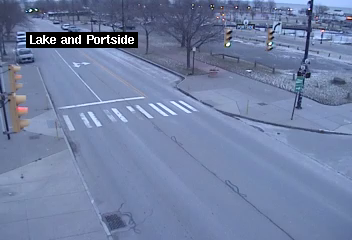

/home/csutter/cron/data/Skyline_5883/20250119/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-19-22:30:11.jpg
dry
dry
20250119_2230
1


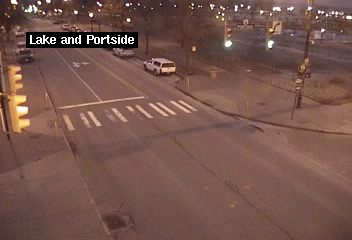

/home/csutter/cron/data/Skyline_5883/20250119/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-19-23:02:28.jpg
dry
dry
20250119_2300
2


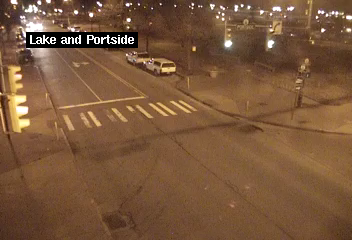

/home/csutter/cron/data/Skyline_5883/20250119/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-19-23:32:28.jpg
dry
dry
20250119_2330
3


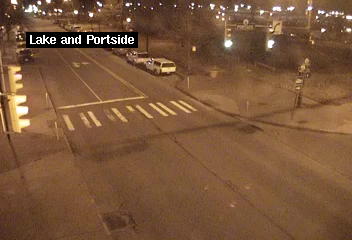

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-00:00:17.jpg
dry
wet
20250120_0000
4


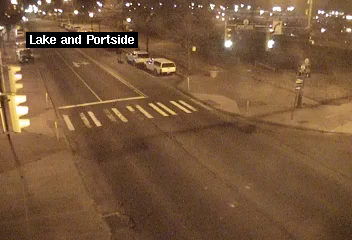

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-00:30:15.jpg
dry
wet
20250120_0030
5


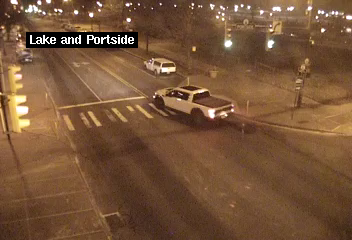

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-01:00:11.jpg
dry
dry
20250120_0100
6


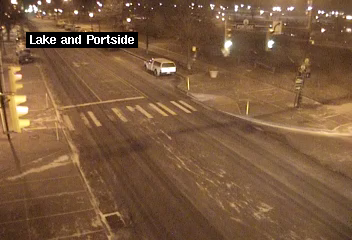

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-01:30:14.jpg
snow
dry
20250120_0130
7


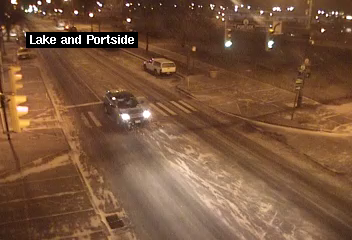

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-02:00:15.jpg
snow
wet
20250120_0200
8


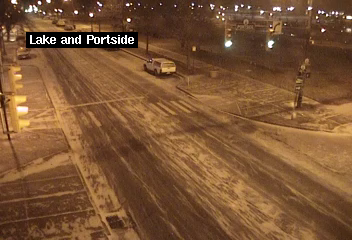

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-02:30:15.jpg
snow
wet
20250120_0230
9


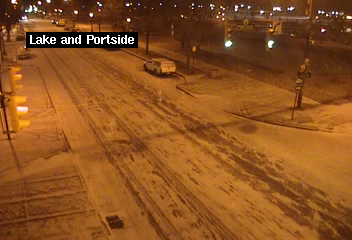

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-03:00:12.jpg
snow
wet
20250120_0300
10


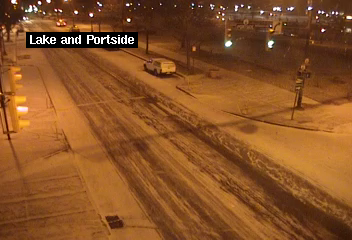

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-11:00:09.jpg
snow_severe
snow_severe
20250120_1100
11


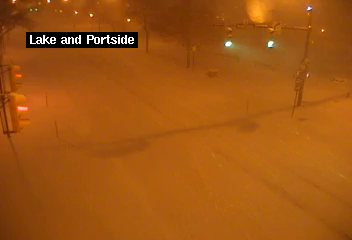

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-12:00:09.jpg
snow_severe
snow_severe
20250120_1200
12


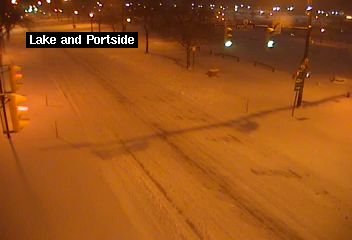

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-13:00:12.jpg
snow_severe
wet
20250120_1300
13


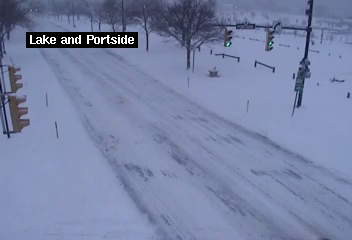

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-16:00:17.jpg
snow
snow
20250120_1600
14


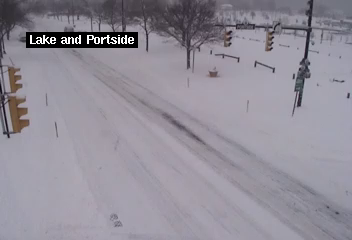

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-17:00:15.jpg
snow
snow
20250120_1700
15


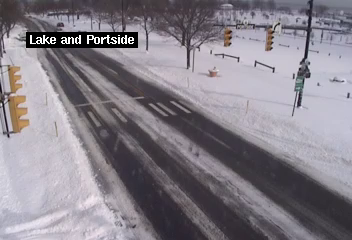

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-18:00:12.jpg
snow
snow
20250120_1800
16


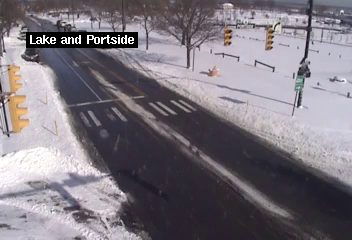

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-18:30:14.jpg
wet
snow
20250120_1830
17


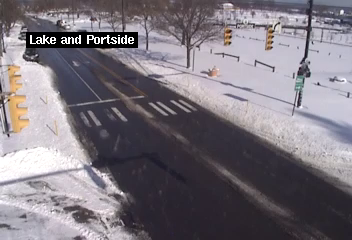

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-19:00:14.jpg
wet
wet
20250120_1900
18


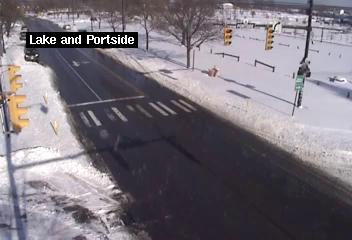

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-19:30:12.jpg
wet
wet
20250120_1930
19


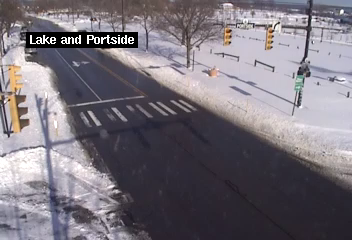

/home/csutter/cron/data/Skyline_5883/20250120/Lake_Ave_at_Portside_Dr__Unknown__Skyline_5883_2025-01-20-20:00:11.jpg
wet
dry
20250120_2000
20


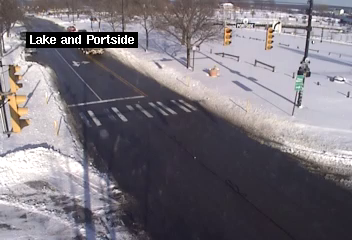

In [19]:
site1 = "Skyline_5883"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

# Fcst predicts snow the whole time
# early nowcast dry preds are wrong, but at least it's capturing severity (no snow accumulation yet)
# the moment we get snow accumulation, nowcast does pick up on it
# result: fcst is COARSE. predicting snow very early on



/home/csutter/cron/data/Skyline_5009/20250119/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-19-22:00:49.jpg
snow_severe
snow
20250119_2200
0


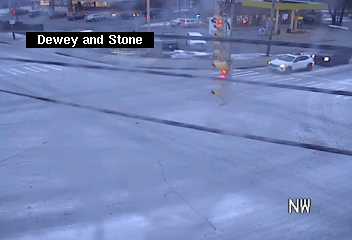

/home/csutter/cron/data/Skyline_5009/20250119/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-19-22:27:59.jpg
dry
snow
20250119_2230
1


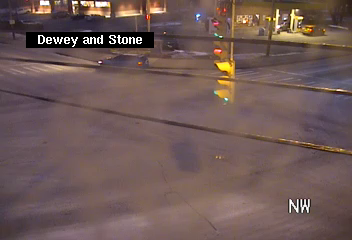

/home/csutter/cron/data/Skyline_5009/20250119/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-19-23:00:41.jpg
dry
snow
20250119_2300
2


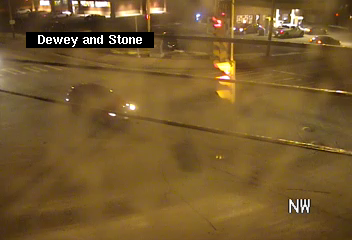

/home/csutter/cron/data/Skyline_5009/20250119/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-19-23:32:50.jpg
wet
snow
20250119_2330
3


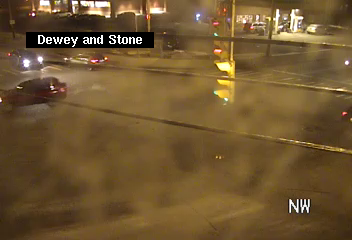

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-00:03:04.jpg
dry
snow
20250120_0000
4


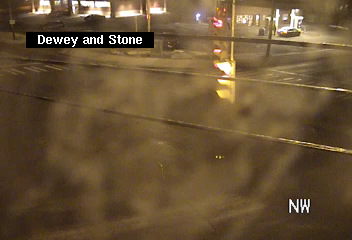

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-00:30:37.jpg
wet
snow
20250120_0030
5


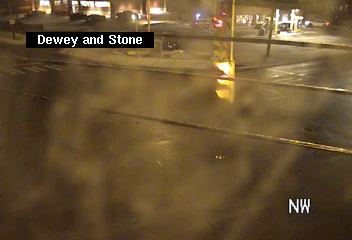

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-01:00:40.jpg
wet
snow
20250120_0100
6


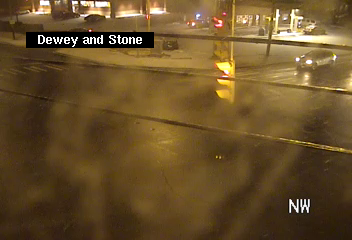

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-01:30:43.jpg
wet
snow
20250120_0130
7


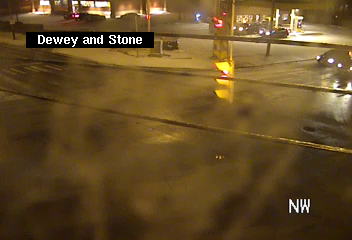

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-02:00:42.jpg
wet
wet
20250120_0200
8


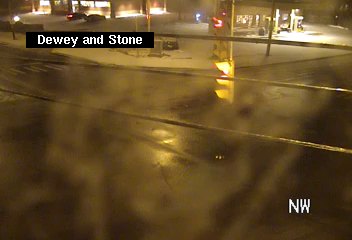

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-02:30:40.jpg
snow
wet
20250120_0230
9


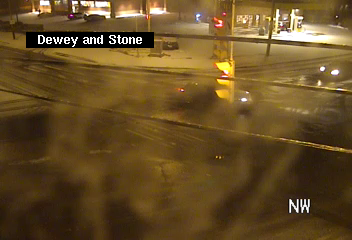

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-03:00:35.jpg
snow
snow
20250120_0300
10


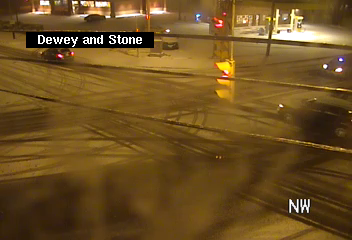

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-11:02:50.jpg
snow_severe
snow_severe
20250120_1100
11


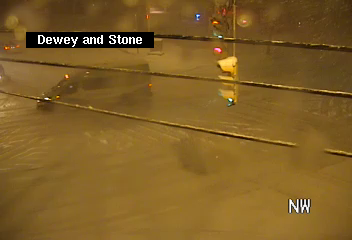

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-12:00:43.jpg
snow_severe
snow
20250120_1200
12


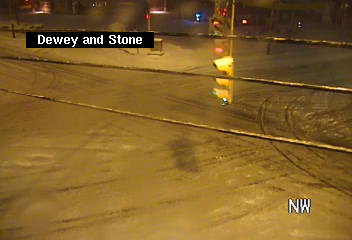

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-12:55:49.jpg
snow
snow
20250120_1300
13


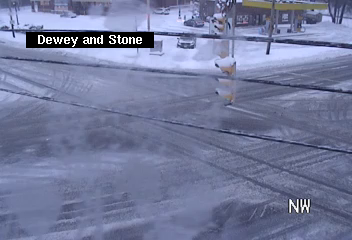

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-16:00:37.jpg
snow
snow
20250120_1600
14


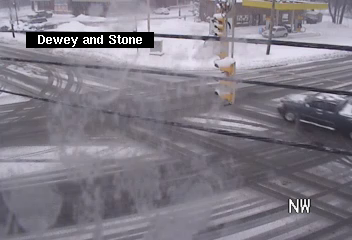

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-17:00:44.jpg
wet
snow
20250120_1700
15


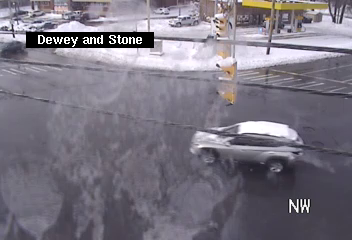

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-18:02:56.jpg
wet
snow
20250120_1800
16


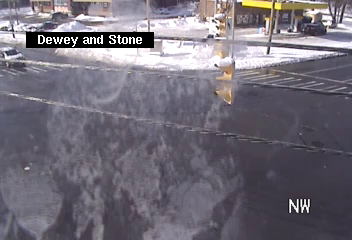

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-18:30:42.jpg
wet
snow
20250120_1830
17


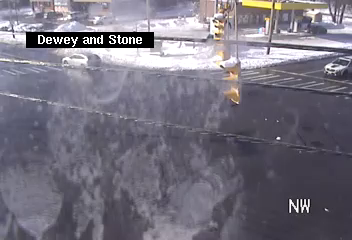

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-18:57:59.jpg
wet
snow
20250120_1900
18


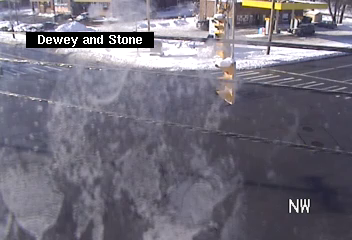

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-19:30:45.jpg
snow
snow
20250120_1930
19


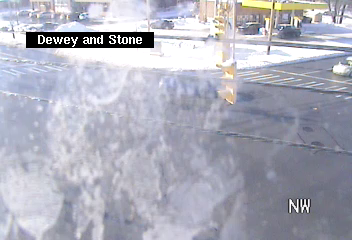

/home/csutter/cron/data/Skyline_5009/20250120/Dewey_Ave_at_Stone_Rd__Unknown__Skyline_5009_2025-01-20-20:00:37.jpg
snow
snow
20250120_2000
20


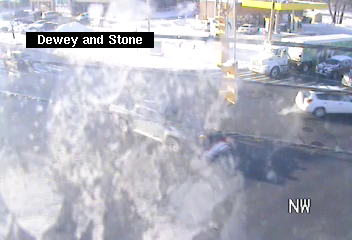

In [20]:
site1 = "Skyline_5009"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

# Fcst predicts snow the whole time
# early nowcast dry preds are wrong, but at least it's capturing severity (no snow accumulation yet)
# the moment we get snow accumulation, nowcast does pick up on it
# result: fcst is COARSE. predicting snow very early on



/home/csutter/cron/data/Skyline_5005/20250119/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-19-22:00:48.jpg
wet
snow
20250119_2200
0


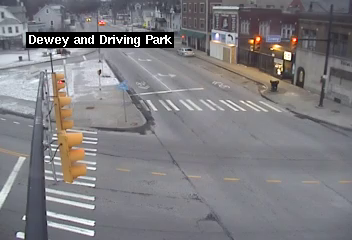

/home/csutter/cron/data/Skyline_5005/20250119/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-19-22:27:58.jpg
wet
snow
20250119_2230
1


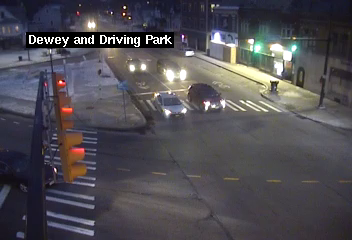

/home/csutter/cron/data/Skyline_5005/20250119/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-19-23:00:41.jpg
wet
snow
20250119_2300
2


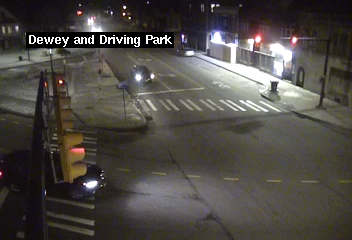

/home/csutter/cron/data/Skyline_5005/20250119/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-19-23:32:49.jpg
wet
snow
20250119_2330
3


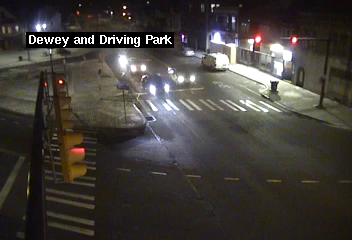

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-00:03:03.jpg
wet
snow
20250120_0000
4


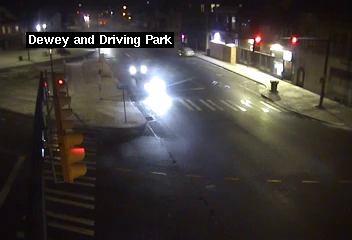

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-00:30:37.jpg
wet
snow
20250120_0030
5


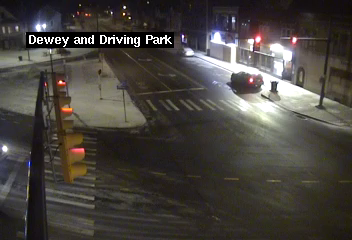

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-01:00:40.jpg
snow
snow
20250120_0100
6


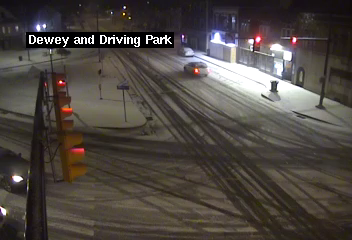

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-01:30:43.jpg
snow
snow
20250120_0130
7


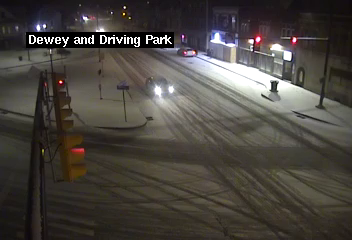

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-02:00:42.jpg
snow
snow
20250120_0200
8


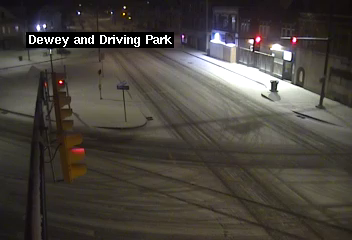

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-02:30:40.jpg
snow
snow
20250120_0230
9


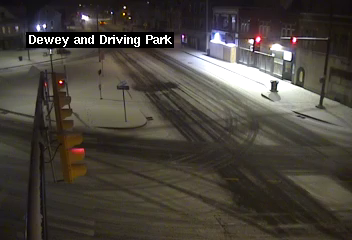

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-03:00:34.jpg
snow
snow
20250120_0300
10


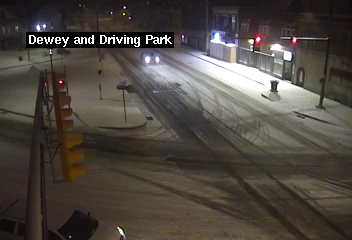

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-11:02:50.jpg
snow_severe
snow
20250120_1100
11


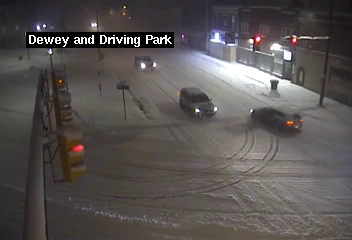

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-12:00:40.jpg
snow
snow
20250120_1200
12


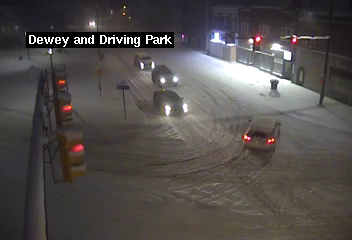

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-12:55:48.jpg
snow_severe
snow
20250120_1300
13


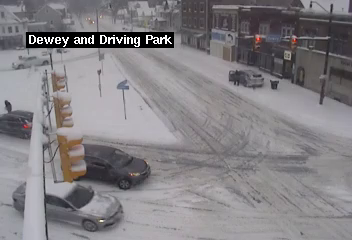

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-16:00:37.jpg
snow
snow
20250120_1600
14


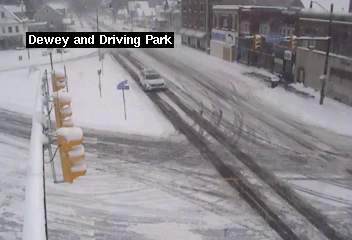

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-17:00:44.jpg
snow
snow
20250120_1700
15


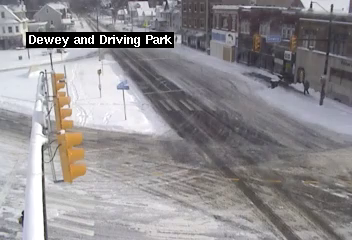

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-18:02:55.jpg
snow
snow
20250120_1800
16


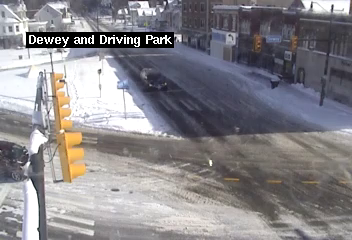

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-18:30:41.jpg
wet
snow
20250120_1830
17


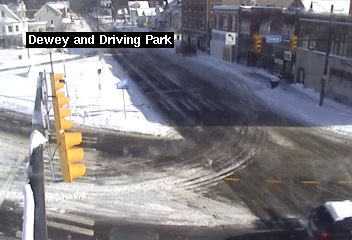

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-18:57:59.jpg
wet
snow
20250120_1900
18


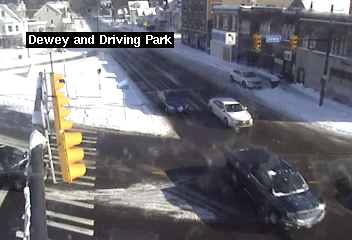

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-19:30:44.jpg
wet
snow
20250120_1930
19


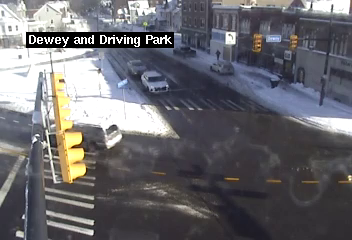

/home/csutter/cron/data/Skyline_5005/20250120/Dewey_Ave_at_Driving_Park_Ave__Unknown__Skyline_5005_2025-01-20-20:00:36.jpg
wet
snow
20250120_2000
20


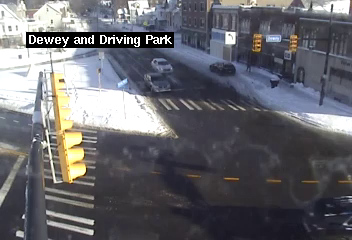

In [10]:
site1 = "Skyline_5005"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

# Fcst predicts snow the whole time
# early nowcast dry preds are wrong, but at least it's capturing severity (no snow accumulation yet)
# the moment we get snow accumulation, nowcast does pick up on it
# result: fcst is COARSE. predicting snow very early on



/home/csutter/cron/data/Skyline_5008/20250119/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-19-22:00:49.jpg
snow
snow
20250119_2200
0


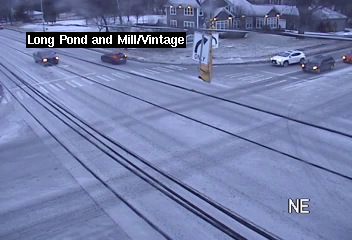

/home/csutter/cron/data/Skyline_5008/20250119/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-19-22:27:59.jpg
snow
snow
20250119_2230
1


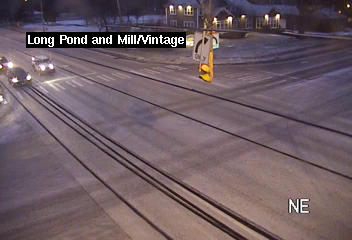

/home/csutter/cron/data/Skyline_5008/20250119/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-19-23:00:41.jpg
snow
snow
20250119_2300
2


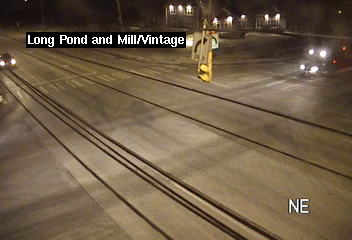

/home/csutter/cron/data/Skyline_5008/20250119/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-19-23:32:50.jpg
snow
snow
20250119_2330
3


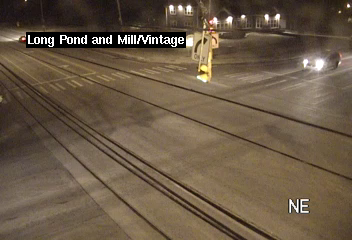

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-00:03:03.jpg
dry
snow
20250120_0000
4


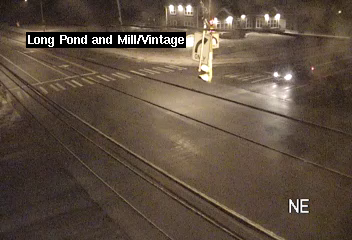

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-00:30:37.jpg
wet
snow
20250120_0030
5


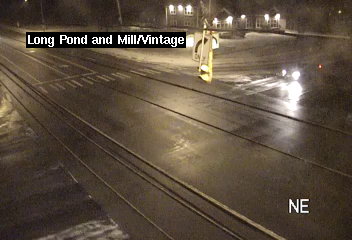

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-01:00:40.jpg
snow
snow
20250120_0100
6


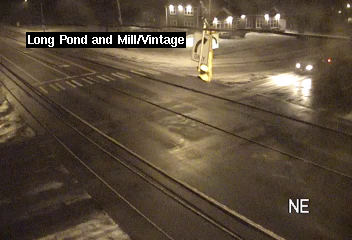

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-01:30:43.jpg
snow
snow
20250120_0130
7


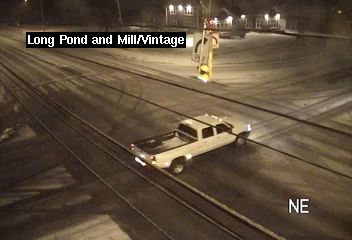

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-02:00:42.jpg
snow
snow
20250120_0200
8


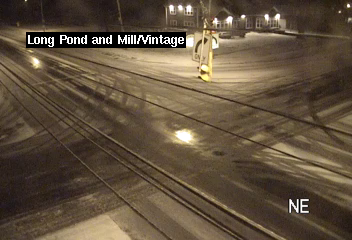

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-02:30:40.jpg
snow
snow
20250120_0230
9


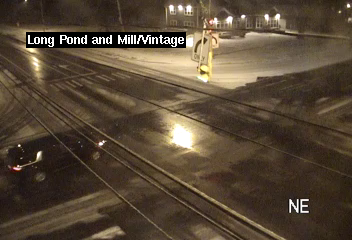

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-03:00:35.jpg
wet
snow
20250120_0300
10


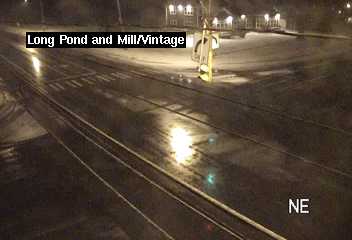

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-11:02:50.jpg
snow
snow_severe
20250120_1100
11


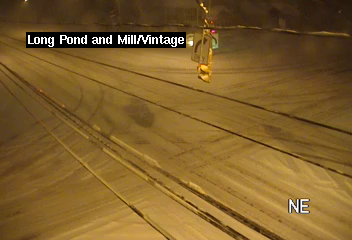

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-12:00:42.jpg
snow
snow
20250120_1200
12


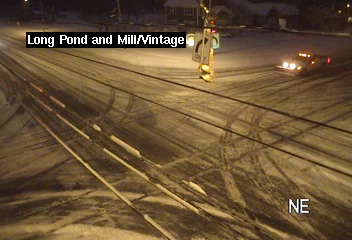

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-12:55:49.jpg
snow
snow
20250120_1300
13


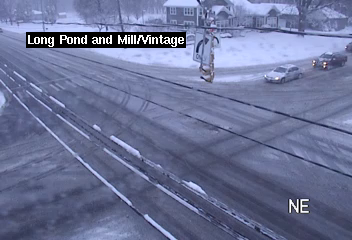

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-16:00:37.jpg
wet
snow
20250120_1600
14


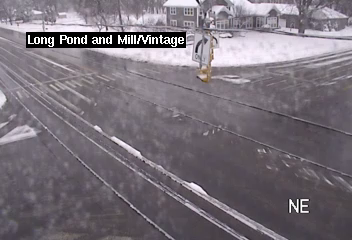

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-17:00:44.jpg
wet
snow
20250120_1700
15


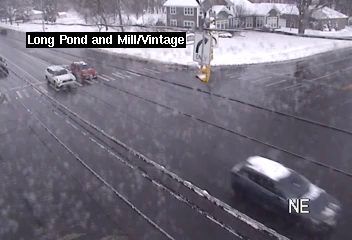

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-18:02:55.jpg
wet
snow
20250120_1800
16


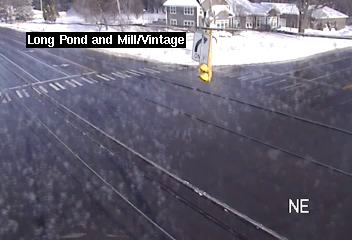

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-18:30:42.jpg
wet
snow
20250120_1830
17


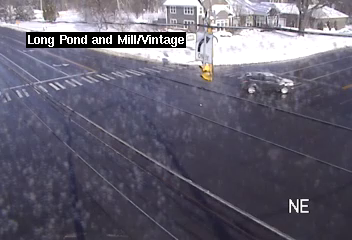

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-18:57:59.jpg
wet
snow
20250120_1900
18


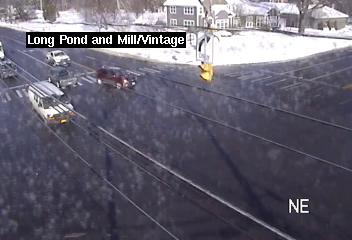

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-19:30:45.jpg
wet
snow
20250120_1930
19


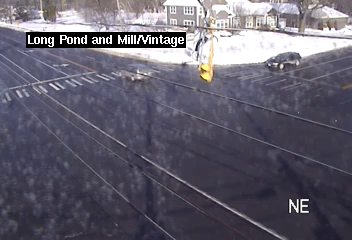

/home/csutter/cron/data/Skyline_5008/20250120/Long_Pond_Rd_at_Mill_Rd_&_Vintage_Ln__Unknown__Skyline_5008_2025-01-20-20:00:37.jpg
wet
snow
20250120_2000
20


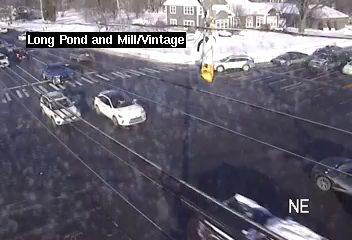

In [16]:
site1 = "Skyline_5008"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

# Fcst predicts snow the whole time
# early nowcast dry preds are wrong, but at least it's capturing severity (no snow accumulation yet)
# the moment we get snow accumulation, nowcast does pick up on it
# result: fcst is COARSE. predicting snow very early on



/home/csutter/cron/data/Skyline_5553/20250119/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-19-22:00:08.jpg
wet
snow
20250119_2200
0


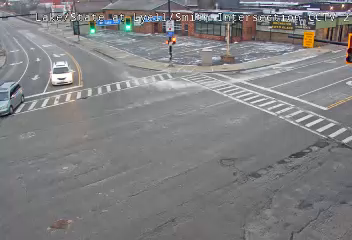

/home/csutter/cron/data/Skyline_5553/20250119/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-19-22:30:06.jpg
dry
snow
20250119_2230
1


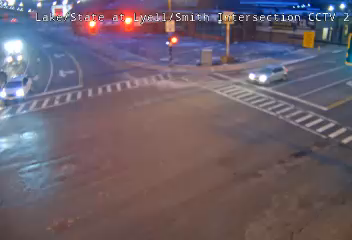

/home/csutter/cron/data/Skyline_5553/20250119/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-19-23:00:07.jpg
dry
snow
20250119_2300
2


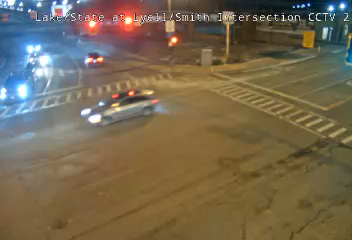

/home/csutter/cron/data/Skyline_5553/20250119/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-19-23:30:08.jpg
wet
snow
20250119_2330
3


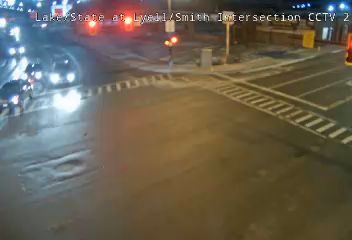

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-00:00:11.jpg
wet
snow
20250120_0000
4


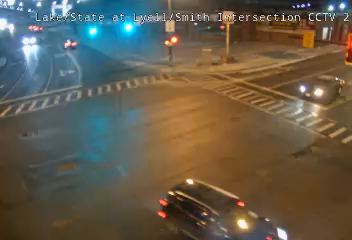

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-00:30:10.jpg
snow
snow
20250120_0030
5


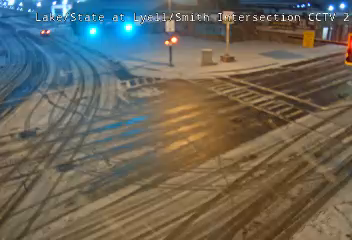

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-01:00:06.jpg
snow
snow
20250120_0100
6


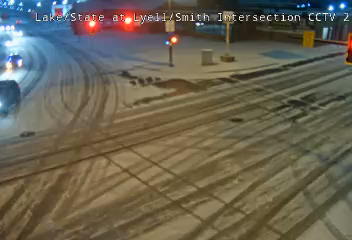

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-01:30:09.jpg
snow
snow
20250120_0130
7


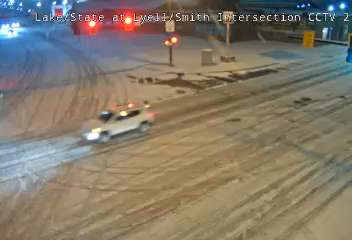

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-02:00:11.jpg
snow
snow
20250120_0200
8


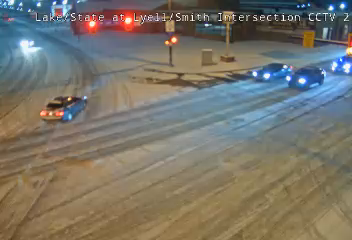

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-02:30:11.jpg
snow
snow
20250120_0230
9


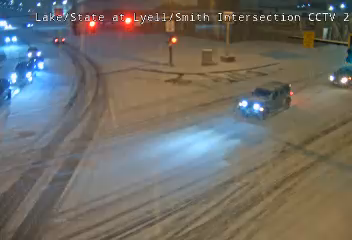

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-03:00:07.jpg
snow
snow
20250120_0300
10


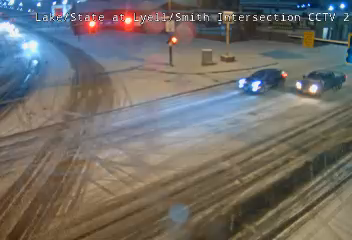

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-16:00:12.jpg
snow
snow
20250120_1600
11


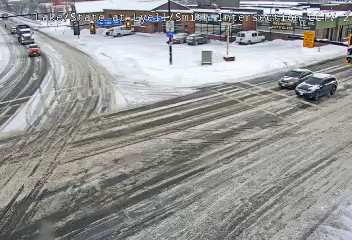

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-17:00:09.jpg
wet
snow
20250120_1700
12


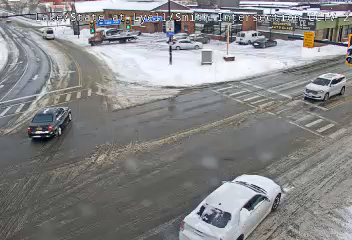

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-18:00:06.jpg
wet
snow
20250120_1800
13


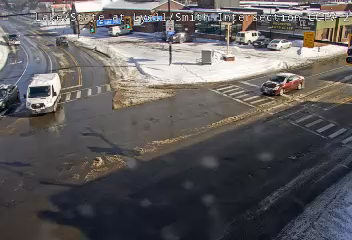

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-18:30:09.jpg
wet
snow
20250120_1830
14


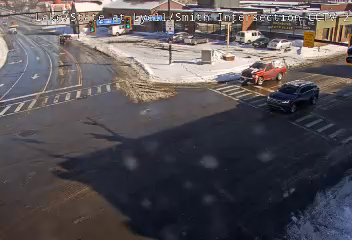

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-19:00:09.jpg
wet
snow
20250120_1900
15


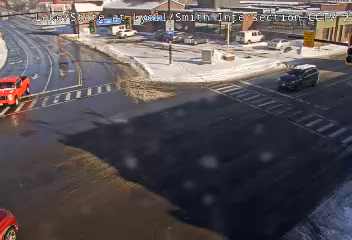

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-19:30:07.jpg
wet
snow
20250120_1930
16


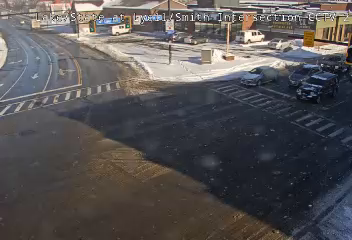

/home/csutter/cron/data/Skyline_5553/20250120/Lake_Ave_at_Smith_St__Unknown__Skyline_5553_2025-01-20-20:00:06.jpg
dry
snow
20250120_2000
17


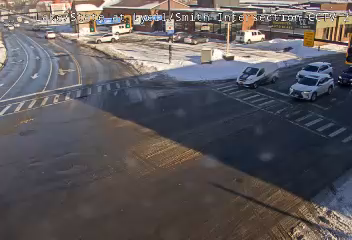

In [57]:
site1 = "Skyline_5553"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

# Fcst predicts snow the whole time
# early nowcast wet preds are wrong, but at least it's capturing severity (no snow accumulation yet)
# nowcast fixes from wet to dry preds
# nowcast then identifies the wet
# and def identifies when snow begins

# the moment we get snow accumulation, nowcast does pick up on it
# result: fcst is COARSE. predicting snow very early on



/home/csutter/cron/data/Skyline_5863/20250119/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-19-22:00:10.jpg
wet
snow
20250119_2200
0


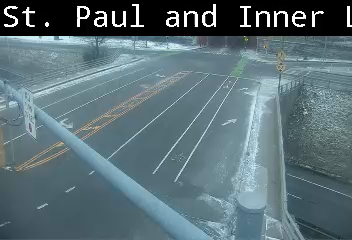

/home/csutter/cron/data/Skyline_5863/20250119/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-19-22:30:08.jpg
wet
snow
20250119_2230
1


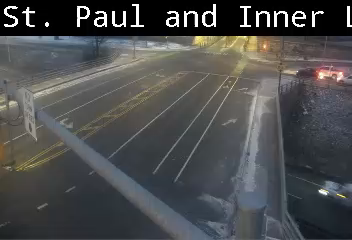

/home/csutter/cron/data/Skyline_5863/20250119/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-19-23:02:25.jpg
wet
snow
20250119_2300
2


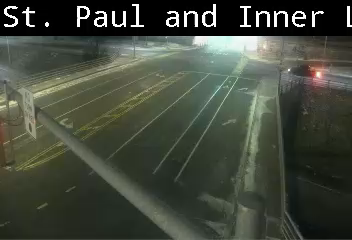

/home/csutter/cron/data/Skyline_5863/20250119/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-19-23:32:24.jpg
wet
snow
20250119_2330
3


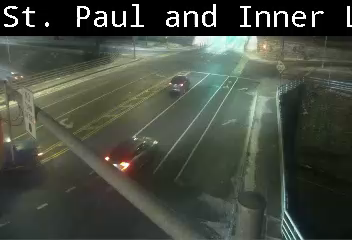

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-00:00:13.jpg
wet
snow
20250120_0000
4


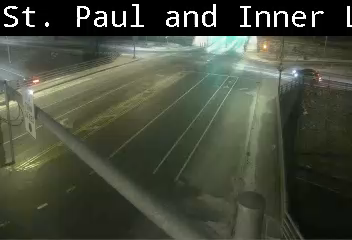

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-00:30:12.jpg
snow
snow
20250120_0030
5


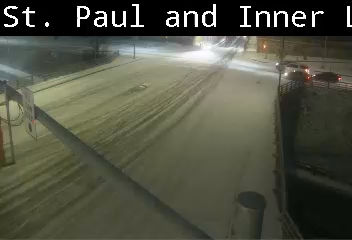

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-01:00:08.jpg
snow_severe
snow
20250120_0100
6


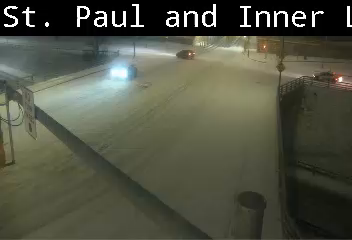

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-01:30:11.jpg
snow
snow
20250120_0130
7


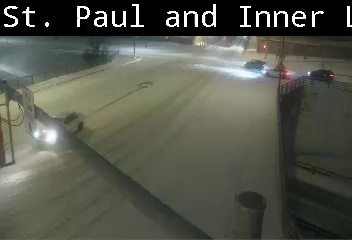

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-02:00:12.jpg
snow
snow
20250120_0200
8


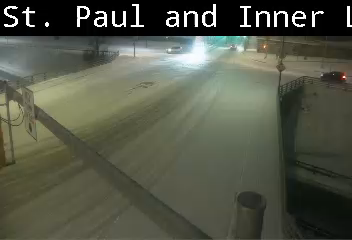

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-02:30:12.jpg
snow_severe
snow
20250120_0230
9


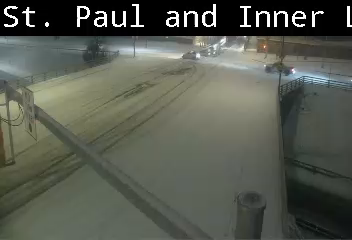

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-03:00:09.jpg
wet
snow
20250120_0300
10


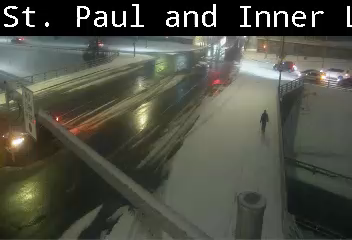

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-11:00:06.jpg
snow
snow
20250120_1100
11


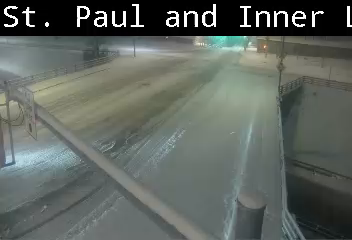

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-12:00:07.jpg
snow_severe
snow
20250120_1200
12


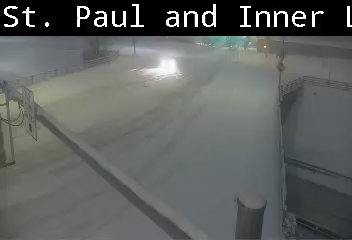

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-13:00:09.jpg
snow
snow
20250120_1300
13


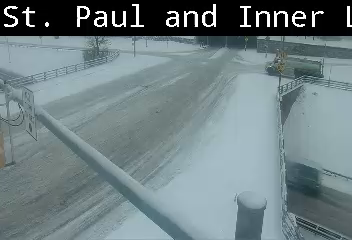

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-16:00:13.jpg
snow
snow
20250120_1600
14


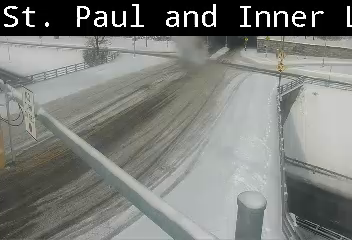

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-17:00:11.jpg
snow
snow
20250120_1700
15


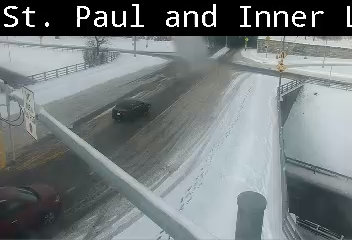

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-18:00:08.jpg
snow
snow
20250120_1800
16


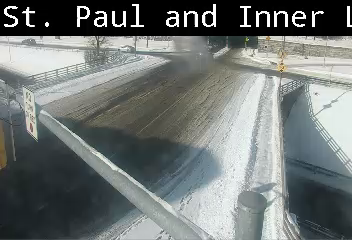

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-18:30:10.jpg
snow
snow
20250120_1830
17


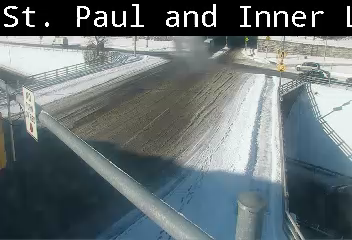

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-19:00:11.jpg
snow
snow
20250120_1900
18


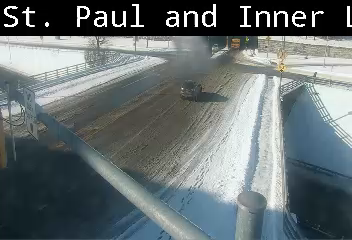

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-19:30:09.jpg
snow
snow
20250120_1930
19


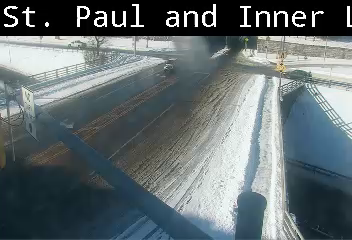

/home/csutter/cron/data/Skyline_5863/20250120/St._Paul_St_at_Inner_Loop__Unknown__Skyline_5863_2025-01-20-20:00:08.jpg
snow
snow
20250120_2000
20


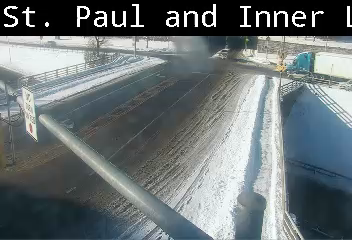

In [11]:
site1 = "Skyline_5863"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

# has some severe snow cases which i like
# maybe argument for mnowcatsing nbeing wrong and should be predicting sevre snow 
# but otherwise getting the onset. 




/home/csutter/cron/data/Skyline_5018/20250119/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-19-22:00:50.jpg
wet
snow
20250119_2200
0


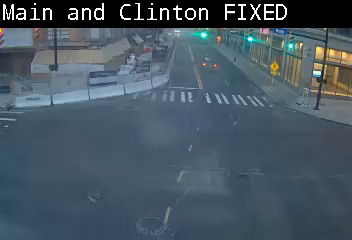

/home/csutter/cron/data/Skyline_5018/20250119/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-19-22:28:01.jpg
wet
snow
20250119_2230
1


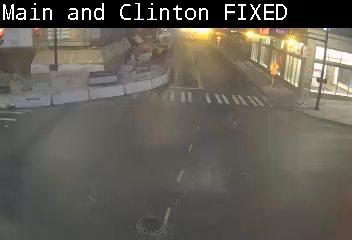

/home/csutter/cron/data/Skyline_5018/20250119/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-19-23:00:42.jpg
wet
snow
20250119_2300
2


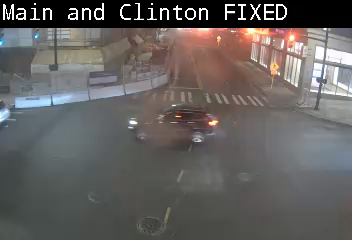

/home/csutter/cron/data/Skyline_5018/20250119/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-19-23:32:51.jpg
snow
snow
20250119_2330
3


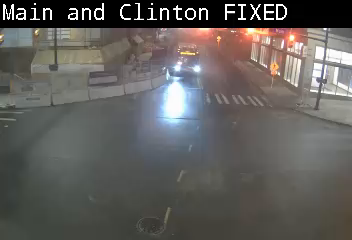

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-00:03:05.jpg
snow
snow
20250120_0000
4


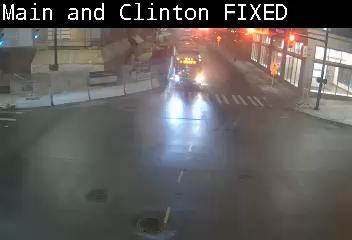

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-00:30:39.jpg
wet
snow
20250120_0030
5


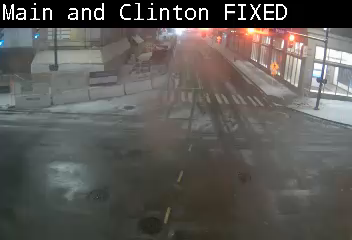

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-01:00:42.jpg
snow
snow
20250120_0100
6


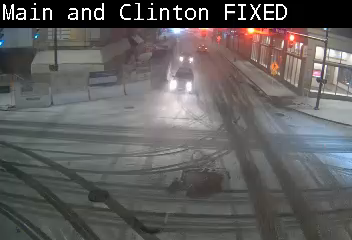

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-01:30:45.jpg
snow
snow
20250120_0130
7


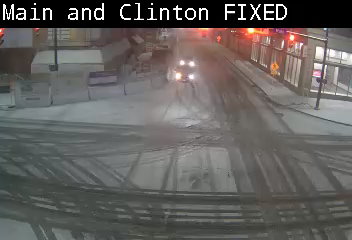

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-02:00:44.jpg
snow
snow
20250120_0200
8


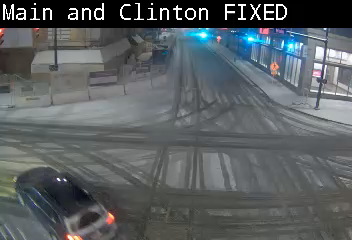

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-02:30:42.jpg
snow
snow
20250120_0230
9


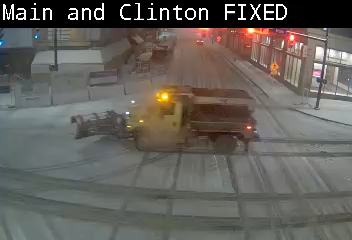

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-03:00:36.jpg
snow
snow
20250120_0300
10


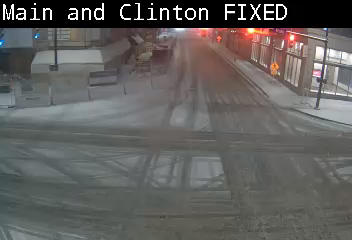

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-16:00:38.jpg
snow
snow
20250120_1600
11


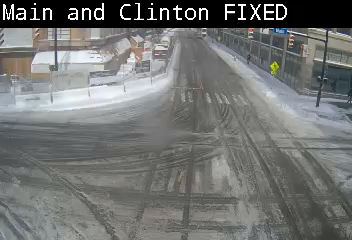

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-17:00:46.jpg
snow
snow
20250120_1700
12


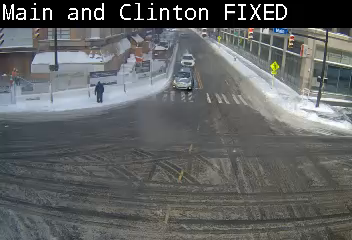

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-18:02:57.jpg
snow
snow
20250120_1800
13


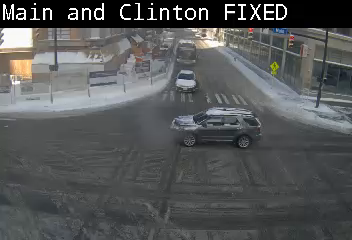

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-18:30:44.jpg
snow
snow
20250120_1830
14


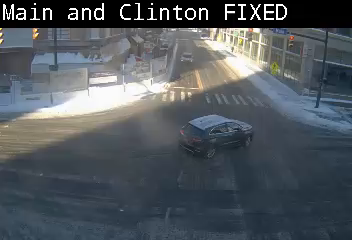

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-18:58:01.jpg
wet
snow
20250120_1900
15


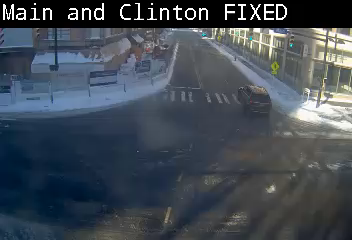

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-19:30:46.jpg
snow
snow
20250120_1930
16


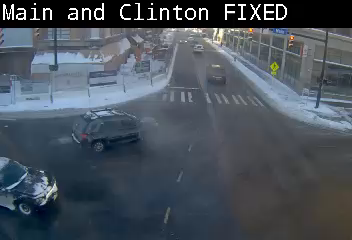

/home/csutter/cron/data/Skyline_5018/20250120/Main_St_at_Clinton_Ave__2__Unknown__Skyline_5018_2025-01-20-20:00:38.jpg
snow
snow
20250120_2000
17


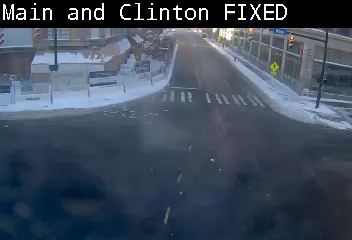

In [59]:
site1 = "Skyline_5018"
s1 = inspect1[inspect1["site"]==site1]
s1s = s1["img_orig"]

from PIL import Image



# AT THE 12/1 TIME WHEN SEVERE SNOW STARTS HAPPENING

for i in range(0,len(s1)):
    im = s1.iloc[i]["img_orig"]
    print(im)
    print(s1.iloc[i]["select"])
    print(s1.iloc[i]["select_fcst"])
    print(s1.iloc[i]["datetime"])
    print(i)
    img = Image.open(im)
    img.show() 

